In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Load data file : TaO100-SiO2tg400-run2 042623

In [41]:
data_folder = 'TaO100-SiO2tg400-run2 042623'
# Gray
Gray_file = f'{data_folder}/TestGray.csv'
df_gray = pd.read_csv(Gray_file)

#Red
Red_file = f'{data_folder}/TestRed.csv'
df_red = pd.read_csv(Red_file)

#Green
Green_file = f'{data_folder}/TestGreen.csv'
df_green = pd.read_csv(Green_file)

#Blue
Blue_file = f'{data_folder}/TestBlue.csv'
df_blue = pd.read_csv(Blue_file)

## Process data : convert to \Delta%R data 

### Create a new row with numerical column names

In [89]:
def create_columns_name(df):
    # Create a new row with numerical column names
    column_names = [str(i) for i in range(1, len(df.columns) + 1)]
    df_processed = pd.DataFrame([column_names] + df.values.tolist())

    # Update the column names of the DataFrame
    df_processed.columns = df_processed.iloc[0]

    # Remove the first row (numerical column names)
    df_processed = df_processed.iloc[1:]
    
    return df_processed

# Process each DataFrame individually
df_gray = process_dataframe(df_gray)
df_red = process_dataframe(df_red)
df_green = process_dataframe(df_green)
df_blue = process_dataframe(df_blue)

In [90]:
df_red

,1,2,3,4,5,6,7,8,9,10,...,55,56,57,58,59,60,61,62,63,64
1,1.463397,74.72125,68.968293,67.128659,88.406901,86.173171,77.751829,82.792683,76.371802,73.409408,...,77.855981,86.660714,117.994048,94.131469,88.081301,89.801394,102.130081,97.95122,100.297909,119.245064
2,2.467287,74.440625,68.917683,67.228659,88.209399,85.59939,77.602439,82.881707,76.757287,73.354239,...,77.821719,86.635714,118.120238,94.157644,87.948316,89.559814,102.226481,97.867015,100.509872,119.300232
3,3.459261,74.671875,69.093293,66.928049,88.255205,86.216463,77.710976,82.878659,76.674598,73.561556,...,78.0482,86.80119,118.020238,94.056514,88.062718,89.456446,102.190476,97.864692,100.267131,119.318235
4,4.477324,74.5525,68.962195,67.188415,88.216538,85.887805,77.640854,82.653049,76.677573,73.425668,...,77.97619,86.564881,118.229762,93.912552,88.03252,89.498258,101.936702,97.872242,100.219512,119.283972
5,4.974203,74.61875,68.932317,67.295122,88.148721,86.148171,77.683537,82.868293,76.428316,73.477352,...,77.78223,86.654167,118.171429,94.174301,87.880952,89.733449,102.094077,98.004065,99.997677,119.278165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2422,2196.439671,72.86375,66.937805,65.579268,86.585366,83.614024,75.996951,80.272561,75.232005,71.60511,...,75.204413,84.068452,115.010119,91.449137,85.399535,86.559233,98.718931,94.87108,96.82288,115.810105
2423,2197.421883,72.976875,67.257927,65.656707,86.119572,83.885366,75.982317,80.710366,75.267103,71.703833,...,75.415796,83.857143,114.955357,91.409875,85.657375,86.912311,98.54878,94.679443,96.773519,115.885598
2424,2197.95001,72.805,67.069512,65.409146,86.546698,83.839024,76.054268,80.269512,75.411065,71.538908,...,75.423926,84.083929,114.831548,91.354551,85.360627,86.42741,98.75784,94.706736,96.640534,115.859466
2425,2198.948241,72.841875,67.064634,65.340854,86.074955,83.905488,75.959756,80.571951,75.066032,71.5482,...,75.306039,84.174405,114.825,91.07674,85.662602,86.530778,98.761324,94.850755,97.085366,115.824623


### Subtract the first value from all the values

In [91]:

def subtract_first_value(df):
    first_value = df.iloc[0, 1:]  # Get the first value (excluding the first column)
    df.iloc[:, 1:] = df.iloc[:, 1:].subtract(first_value)
    return df

# Subtract the first value from each DataFrame individually
df_gray_detlaR = subtract_first_value(df_gray)
df_red_detlaR = subtract_first_value(df_red)
df_green_detlaR = subtract_first_value(df_green)
df_blue_detlaR = subtract_first_value(df_blue)


In [92]:
df_red_detlaR

,1,2,3,4,5,6,7,8,9,10,...,55,56,57,58,59,60,61,62,63,64
1,1.463397,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.467287,-0.280625,-0.05061,0.1,-0.197501,-0.57378,-0.14939,0.089024,0.385485,-0.055168,...,-0.034262,-0.025,0.12619,0.026175,-0.132985,-0.24158,0.0964,-0.084204,0.211963,0.055168
3,3.459261,-0.049375,0.125,-0.20061,-0.151695,0.043293,-0.040854,0.085976,0.302796,0.152149,...,0.192218,0.140476,0.02619,-0.074955,-0.018583,-0.344948,0.060395,-0.086527,-0.030778,0.073171
4,4.477324,-0.16875,-0.006098,0.059756,-0.190363,-0.285366,-0.110976,-0.139634,0.30577,0.01626,...,0.120209,-0.095833,0.235714,-0.218917,-0.04878,-0.303136,-0.19338,-0.078978,-0.078397,0.038908
5,4.974203,-0.1025,-0.035976,0.166463,-0.25818,-0.025,-0.068293,0.07561,0.056514,0.067944,...,-0.073751,-0.006548,0.177381,0.042832,-0.200348,-0.067944,-0.036005,0.052846,-0.300232,0.033101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2422,2196.439671,-1.8575,-2.030488,-1.54939,-1.821535,-2.559146,-1.754878,-2.520122,-1.139798,-1.804297,...,-2.651568,-2.592262,-2.983929,-2.682332,-2.681765,-3.24216,-3.41115,-3.080139,-3.475029,-3.434959
2423,2197.421883,-1.744375,-1.710366,-1.471951,-2.287329,-2.287805,-1.769512,-2.082317,-1.1047,-1.705575,...,-2.440186,-2.803571,-3.03869,-2.721594,-2.423926,-2.889082,-3.581301,-3.271777,-3.52439,-3.359466
2424,2197.95001,-1.91625,-1.89878,-1.719512,-1.860202,-2.334146,-1.697561,-2.523171,-0.960738,-1.870499,...,-2.432056,-2.576786,-3.1625,-2.776919,-2.720674,-3.373984,-3.372242,-3.244483,-3.657375,-3.385598
2425,2198.948241,-1.879375,-1.903659,-1.787805,-2.331945,-2.267683,-1.792073,-2.220732,-1.30577,-1.861208,...,-2.549942,-2.48631,-3.169048,-3.054729,-2.418699,-3.270616,-3.368757,-3.100465,-3.212544,-3.420441


# Compare band 

### STD comparison 

In [148]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray_detlaR.iloc[:, 1:], axis=0)
std_red = np.std(df_red_detlaR.iloc[:, 1:], axis=0)
std_green = np.std(df_green_detlaR.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue_detlaR.iloc[:, 1:], axis=0)

# Create a table of standard deviation values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table = pd.DataFrame({'Sensor': sensors, 'Gray': std_gray, 'Red': std_red, 'Green': std_green,
                             'Blue': std_blue})

# Display the table
print(result_table)

   Sensor      Gray       Red     Green      Blue
0                                                
2       2   0.33256   0.85092  0.187975  0.732417
3       3  0.338001  0.901822  0.298296  0.540577
4       4  0.453483  0.883634  0.514392   0.60542
5       5  0.548208  1.145535  0.539758  0.792509
6       6  0.340583  1.020142  0.339055    0.9539
..    ...       ...       ...       ...       ...
60     60  0.608347  1.274734  0.567467  0.875784
61     61  0.498585  1.313451  0.424886  1.149551
62     62  0.574875  1.255557  0.551547  1.000899
63     63  0.538617  1.304851  0.415465  0.828031
64     64  0.451566  1.462856   0.27895  0.973948

[63 rows x 5 columns]


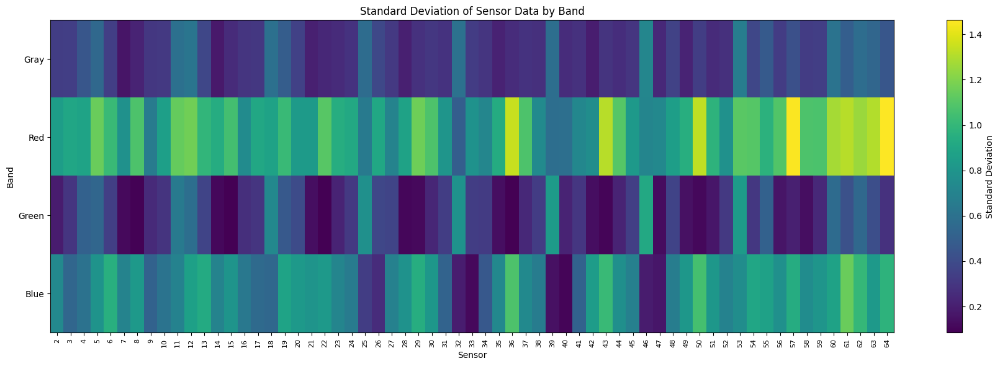

In [97]:

# Visualize the result as a heatmap
result_data = result_table.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Standard Deviation')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('Standard Deviation of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### the most responsive sensor

In [104]:
# Calculate the average std for each band
average_std = result_table[['Gray', 'Red', 'Green', 'Blue']].mean(axis=1)

# Rank the sensors based on their average std values
ranked_sensors = average_std.sort_values(ascending=False)

# Get the top 10 most responsive sensors
top_10_sensors = ranked_sensors.index[:10]

# Print the result
print("\033[1;34mMost responsive sensor\033[0m:", top_10_sensors[0], "(Std:",result_table.loc[top_10_sensors[0], 'Red'], ")")
print("\n\033[1;34mTop 10 most responsive sensors:\033[0m")
for i, sensor in enumerate(top_10_sensors[1:], start=1):
    suffix = "st" if i == 1 else "nd" if i == 2 else "rd" if i == 3 else "th"
    print(f"{i}{suffix}: {sensor} (Std: {result_table.loc[sensor, 'Red']:2f})")

Most responsive sensor: 61 (Std: 1.3134507094005752 )

Top 10 most responsive sensors:
1st: 62 (Std: 1.255557)
2nd: 53 (Std: 1.109294)
3rd: 60 (Std: 1.274734)
4th: 12 (Std: 1.163509)
5th: 64 (Std: 1.462856)
6th: 63 (Std: 1.304851)
7th: 11 (Std: 1.135256)
8th: 5 (Std: 1.145535)
9th: 57 (Std: 1.453941)


#### the most suitable band base on STD

In [105]:
# Calculate the average std for each band
average_std = result_table[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_std.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mMost Suitable Band for Further Analysis:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg Std: {avg_std:.4f})")

Most Suitable Band for Further Analysis:
1st: Red (Avg Std: 0.9623)
2st: Blue (Avg Std: 0.7012)
3st: Gray (Avg Std: 0.3627)
4st: Green (Avg Std: 0.3310)


### SNR (Signal-to-Noise Ratio) comparison 

In [118]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray_detlaR.iloc[:, 1:], axis=0)
std_red = np.std(df_red_detlaR.iloc[:, 1:], axis=0)
std_green = np.std(df_green_detlaR.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue_detlaR.iloc[:, 1:], axis=0)

# Compute mean by columns (sensors) for each band
mean_gray = np.mean(df_gray_detlaR.iloc[:, 1:], axis=0)
mean_red = np.mean(df_red_detlaR.iloc[:, 1:], axis=0)
mean_green = np.mean(df_green_detlaR.iloc[:, 1:], axis=0)
mean_blue = np.mean(df_blue_detlaR.iloc[:, 1:], axis=0)

# Compute SNR for each band
"""
The mean and standard deviation are used to calculate the SNR because they are measures of the central tendency and variability of the signal data. 
The mean is the average value of the signal data and the standard deviation is a measure of how much the signal data deviates from the mean. 
The SNR is calculated by dividing the mean by the standard deviation.
"""
snr_gray = mean_gray / std_gray
snr_red = mean_red / std_red
snr_green = mean_green / std_green
snr_blue = mean_blue / std_blue



# Create a table of SNR values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_SNR = pd.DataFrame({'Sensor': sensors, 'Gray': snr_gray, 'Red': snr_red, 'Green': snr_green,
                             'Blue': snr_blue})

# Display the table
print(result_table_SNR)


   Sensor      Gray       Red     Green      Blue
0                                                
2       2 -0.914631 -1.294771  0.419746  0.924555
3       3 -0.925788 -1.197275 -0.130629  1.060615
4       4  -0.44274 -1.125564 -0.029312  0.929009
5       5 -0.703572 -1.385347  0.040653    0.9562
6       6 -0.647225 -1.369382   0.50588  0.982322
..    ...       ...       ...       ...       ...
60     60 -0.892981 -1.407364 -0.296084  0.833685
61     61 -1.214143 -1.401344 -0.737387  1.117147
62     62 -0.662185 -1.249392  0.003839  0.978897
63     63 -0.841323 -1.259002 -0.219647   1.22025
64     64 -0.915312 -1.220685  0.041939  1.220004

[63 rows x 5 columns]


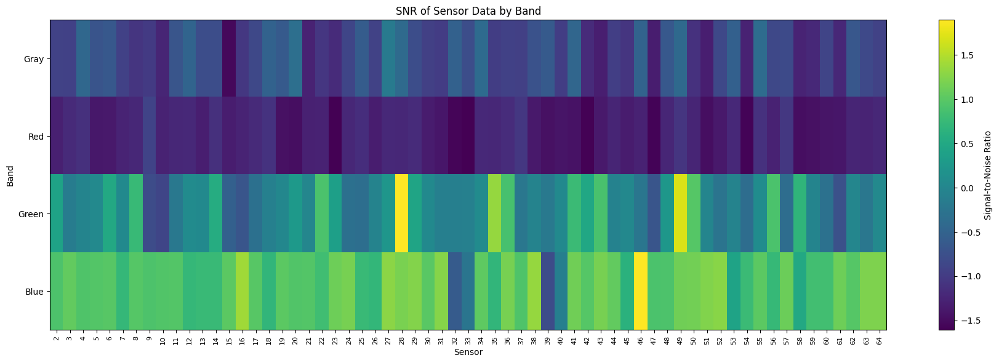

In [119]:
# Visualize the result as a heatmap
result_data = result_table.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Signal-to-Noise Ratio')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('SNR of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### Less noisy band

In [121]:
# Calculate the average std for each band
average_std = result_table[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_std.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mLess noisy:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg SNR: {avg_std:.4f})")

Less noisy:
1st: Blue (Avg SNR: 0.9045)
2st: Green (Avg SNR: 0.1188)
3st: Gray (Avg SNR: -0.8485)
4st: Red (Avg SNR: -1.2984)


### FFT 

In [141]:
import pywt

# Apply Wavelet Transform to the variation data of each band
level = 4  # Adjust the level if necessary
coeffs_gray = pywt.wavedec(df_gray_detlaR.iloc[:, 1:], 'db4', level=level)
coeffs_red = pywt.wavedec(df_red_detlaR.iloc[:, 1:], 'db4', level=level)
coeffs_green = pywt.wavedec(df_green_detlaR.iloc[:, 1:], 'db4', level=level)
coeffs_blue = pywt.wavedec(df_blue_detlaR.iloc[:, 1:], 'db4', level=level)

# Further processing and analysis of the wavelet coefficients can be done here
# Analyze the frequency components in the wavelet domain

# Compute the magnitude of the wavelet coefficients for visualization
magnitude_gray = [np.abs(c) for c in coeffs_gray]
magnitude_red = [np.abs(c) for c in coeffs_red]
magnitude_green = [np.abs(c) for c in coeffs_green]
magnitude_blue = [np.abs(c) for c in coeffs_blue]
# Perform visualization or analysis based on the magnitude of the wavelet coefficients
# You can plot the magnitude coefficients or extract relevant frequency information


# Create a DataFrame to store the magnitude values
df_magnitude = pd.DataFrame({'Gray': magnitude_gray, 'Red': magnitude_red, 'Green': magnitude_green, 'Blue': magnitude_blue})

# Display the DataFrame
print(df_magnitude)



C:\Users\mthia\anaconda3\envs\intern\lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 4 is too high: all coefficients will experience boundary effects.
  warnings.warn(


                                                Gray   
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...  \
1  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
2  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
3  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
4  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                                 Red   
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...  \
1  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
2  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
3  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
4  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                               Green   
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...  \
1  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
2  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
3  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
4  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

### distributions of the variation: Kruskal-Wallis test and analysis of variance (ANOVA)

In [138]:

import scipy.stats as stats


# Extract the variation data for each band
var_gray = df_gray_detlaR.iloc[:, 1:]
var_red = df_red_detlaR.iloc[:, 1:]
var_green = df_green_detlaR.iloc[:, 1:]
var_blue = df_blue_detlaR.iloc[:, 1:]

# Perform the Kruskal-Wallis test
statistic, p_value = kruskal(var_gray, var_red, var_green, var_blue)

# Display the test results
print(f'Kruskal-Wallis Test:\nStatistic: {statistic}\nP-value: {p_value}')

Kruskal-Wallis Test:
Statistic: [4370.0066891  4104.02766883 3459.68510152 4600.75769212 4758.93962701
 3067.64390109 4463.73592761 2970.45447142 3834.98896978 3763.42213104
 3703.69818507 3679.17089671 2762.05860385 5298.59917233 5243.47511784
 3593.0523341  3044.69413101 4729.10653902 4584.20991151 4334.83550531
 4417.44137597 6615.64562151 4331.36032191 2537.73594304 4100.74498672
 4597.86835847 5447.84676767 4974.62719744 4664.4458097  5130.3716903
 1874.9608873  4016.50423942 4117.72738646 4198.01010404 4719.48088825
 2754.42287901 5248.94911857 1773.45283512 3799.10568509 5520.12954637
 6060.79743242 6852.74005072 4294.65110987 3135.87454585 2764.76764244
 6285.06058429 3907.73311059 4459.9931884  5729.20890356 6544.18711212
 5111.51191989 2891.89885033 5165.10708313 3670.44637993 4396.98611747
 2760.41263219 4956.88325393 4773.73888491 4194.69259609 5368.14887673
 4157.18081009 5471.87330422 5480.5081269 ]
P-value: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [128]:
from scipy.stats import f_oneway

# Perform the ANOVA test
statistic, p_value = f_oneway(var_gray, var_red, var_green, var_blue)

# Display the test results
print("ANOVA Test:")
print(f"Statistic: {statistic}")
print(f"P-value: {p_value}")


ANOVA Test:
Statistic: [3825.43203611 3480.1099841  2479.46337875 3682.7412543  4209.86241206
 3255.8276328  3949.60020803 2324.10469017 3519.86342699 2745.52911504
 2497.91893768 3205.57108003 3058.00693788 4414.71435565 4967.29969687
 3315.68428024 1567.61590725 4080.4647937  4096.88811359 4023.04188144
 3800.06386779 6019.90827414 4015.7493483  1127.76710316 3096.27932557
 4066.93877649 4629.86047791 4523.9135964  4283.5866611  4688.69592819
  783.51901719 3927.96163078 3252.16642711 3350.11434147 4333.97194024
 2913.10080582 5034.86940835  768.84805076 3160.61452284 4928.65645507
 5080.41754639 5237.16333935 4104.85392635 3027.81456522 1354.26471085
 4864.18914678 3295.50034741 3899.46749976 4599.68245055 5779.96821094
 4882.4547511  1669.92423478 4385.37937359 2885.76928979 3580.8593267
 3329.31712077 3977.97952946 4270.25636249 3443.77815109 4608.12375222
 3350.40887804 4064.83536346 4334.12518952]
P-value: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.


###### A p-value of 0 means that the observed data is highly unlikely under the null hypothesis, which assumes that the variations across bands are the same.

### 

## Visualization of the most high_STD Band : Red 

### Plot Raw delta%R data

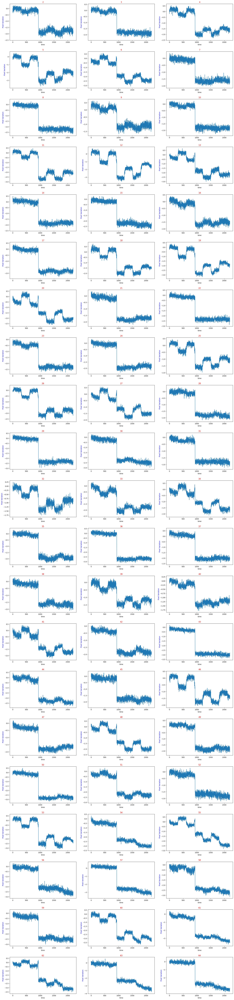

In [110]:
# Get the column names excluding the frame column
df = df_red_detlaR
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['1'], df[sensor])
    ax.set_title(sensor, color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

### Plot filtered delta%R data: Red 

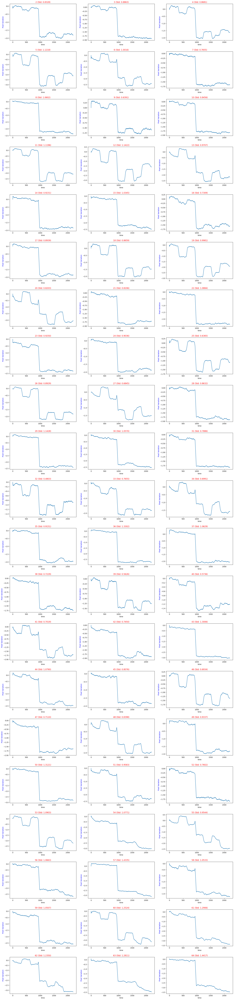

In [111]:
# Get the column names excluding the frame column
sensor_columns = df_red_detlaR.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data
window_size = 50 # Adjust the window size as desired
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_red_detlaR[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_red_detlaR['1'], filtered_data) 
    std_value = np.std(df_red_detlaR[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
    ax.set_title(f"{sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis


# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Gray band 

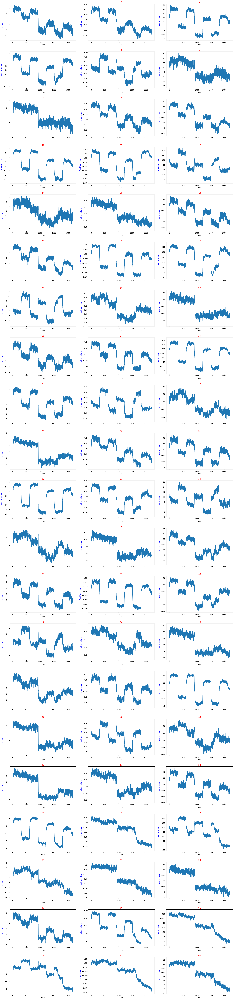

In [86]:
# Get the column names excluding the frame column
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['1'], df[sensor])
    ax.set_title(sensor, color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

### 

### Plot Green Band 

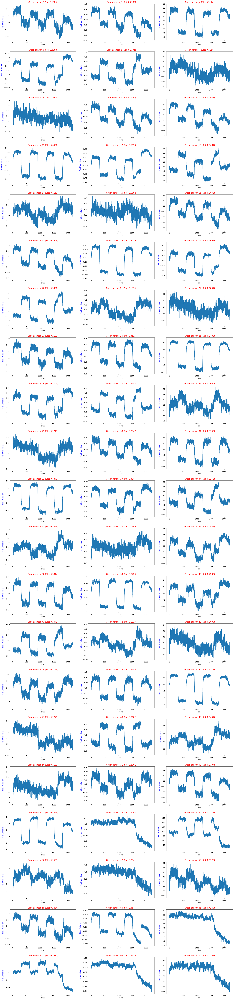

In [113]:
# Get the column names excluding the frame column
df = df_green_detlaR
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['1'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Green sensor_{sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#### filtered green band data

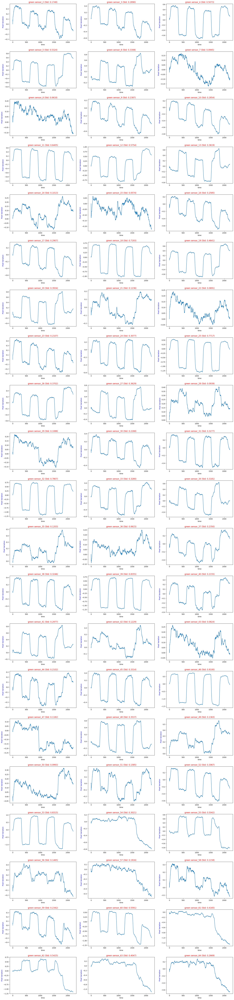

In [115]:
# Get the column names excluding the frame column
sensor_columns = df_green_detlaR.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data
window_size = 30 # Adjust the window size as desired
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_green_detlaR[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_green_detlaR['1'], filtered_data) 
    std_value = np.std(df_green_detlaR[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
    ax.set_title(f"green sensor_{sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis


# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Blue Band 

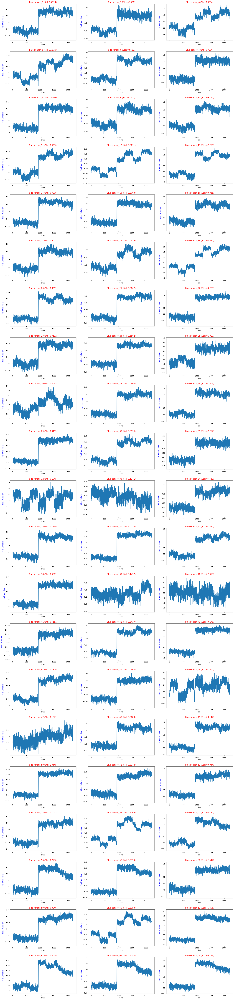

In [117]:
# Get the column names excluding the frame column
df = df_blue_detlaR
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['1'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Blue sensor_{sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#